In [84]:
import pyranges as pr
from Bio import SeqIO
from Bio.Seq import Seq
from Bio.SeqRecord import SeqRecord
from collections import defaultdict
import gzip
import pandas as pd
import random
import json

from pandasql import sqldf
import pandas as pd
from sklearn import datasets
import matplotlib.pyplot as plt
from collections import deque
import math

In [3]:
bed_path = 'Flybase_dm6_TSSs.bed'
fasta_path = 'GCF_000001215.4_Release_6_plus_ISO1_MT_genomic.fa'

gr = pr.read_bed(bed_path)

In [4]:
print(gr)

+--------------+-----------+-----------+-------------+------------+-------+
| Chromosome   | Start     | End       | Name        | Score      | +1    |
| (category)   | (int64)   | (int64)   | (object)    | (object)   | ...   |
|--------------+-----------+-----------+-------------+------------+-------|
| chr2L        | 305811    | 305811    | FBgn0004611 | .          | ...   |
| chr2L        | 310076    | 310076    | FBgn0004611 | .          | ...   |
| chr2L        | 305811    | 305811    | FBgn0004611 | .          | ...   |
| chr2L        | 310076    | 310076    | FBgn0004611 | .          | ...   |
| ...          | ...       | ...       | ...         | ...        | ...   |
| chrX         | 22471897  | 22471897  | FBgn0031188 | .          | ...   |
| chrX         | 22471897  | 22471897  | FBgn0031188 | .          | ...   |
| chrX         | 22449367  | 22449367  | FBgn0031184 | .          | ...   |
| chrX         | 22449279  | 22449279  | FBgn0031184 | .          | ...   |
+-----------

In [5]:
print(gr.df)

      Chromosome     Start       End         Name Score Strand
0          chr2L    305811    305811  FBgn0004611     .      +
1          chr2L    310076    310076  FBgn0004611     .      +
2          chr2L    305811    305811  FBgn0004611     .      +
3          chr2L    310076    310076  FBgn0004611     .      +
4          chr2L    305811    305811  FBgn0004611     .      +
...          ...       ...       ...          ...   ...    ...
30670       chrX  22481903  22481903  FBgn0031190     .      -
30671       chrX  22471897  22471897  FBgn0031188     .      -
30672       chrX  22471897  22471897  FBgn0031188     .      -
30673       chrX  22449367  22449367  FBgn0031184     .      -
30674       chrX  22449279  22449279  FBgn0031184     .      -

[30675 rows x 6 columns]


In [6]:
positions = defaultdict(list)
with open(bed_path) as f:
    for line in f:
        chromosome, start,  end, name, score, strand = line.split()
        chromosome = chromosome.replace('chr','chromosome ')
        positions[chromosome].append((int(start), int(end)))


print(positions)


defaultdict(<class 'list'>, {'chromosome X': [(19961565, 19961565), (19963052, 19963052), (19961173, 19961173), (20051170, 20051170), (20094274, 20094274), (20133666, 20133666), (20133455, 20133455), (20143064, 20143064), (20110451, 20110451), (20092284, 20092284), (20001972, 20001972), (19959279, 19959279), (245854, 245854), (245854, 245854), (255550, 255550), (255550, 255550), (279579, 279579), (342917, 342917), (342917, 342917), (338305, 338305), (342917, 342917), (307560, 307560), (314999, 314999), (356385, 356385), (369907, 369907), (395936, 395936), (409597, 409597), (460623, 460623), (477244, 477244), (476860, 476860), (479307, 479307), (478942, 478942), (479307, 479307), (481814, 481814), (481738, 481738), (481738, 481738), (481814, 481814), (487754, 487754), (494776, 494776), (494490, 494490), (509311, 509311), (493371, 493371), (492899, 492899), (487457, 487457), (469211, 469211), (437324, 437324), (334677, 334677), (334677, 334677), (470602, 470602), (428127, 428127), (33467

In [7]:
fasta_file = open(fasta_path, 'r')
fasta_lines = fasta_file.readlines()

In [8]:
import string 
import re

pattern = r'>\s*([^ ]+)\s+.*chromosome\s+([^\s]+)'
descriptions = {}

for line in fasta_lines:
    if line.startswith('>'):
        if not "sequence" in line:
            print(line)
            match = re.search(pattern, line)
            if match:
                chromosome = "chr" + match.group(2)
                value = match.group(1)
 
                descriptions[chromosome] = value
        

>NC_004354.4 Drosophila melanogaster chromosome X

>NT_033779.5 Drosophila melanogaster chromosome 2L

>NT_033778.4 Drosophila melanogaster chromosome 2R

>NT_037436.4 Drosophila melanogaster chromosome 3L

>NT_033777.3 Drosophila melanogaster chromosome 3R

>NC_004353.4 Drosophila melanogaster chromosome 4

>NC_024512.1 Drosophila melanogaster chromosome Y

>NC_024511.2 Drosophila melanogaster mitochondrion, complete genome



In [9]:
print(descriptions)
print(positions)

{'chrX': 'NC_004354.4', 'chr2L': 'NT_033779.5', 'chr2R': 'NT_033778.4', 'chr3L': 'NT_037436.4', 'chr3R': 'NT_033777.3', 'chr4': 'NC_004353.4', 'chrY': 'NC_024512.1'}
defaultdict(<class 'list'>, {'chromosome X': [(19961565, 19961565), (19963052, 19963052), (19961173, 19961173), (20051170, 20051170), (20094274, 20094274), (20133666, 20133666), (20133455, 20133455), (20143064, 20143064), (20110451, 20110451), (20092284, 20092284), (20001972, 20001972), (19959279, 19959279), (245854, 245854), (245854, 245854), (255550, 255550), (255550, 255550), (279579, 279579), (342917, 342917), (342917, 342917), (338305, 338305), (342917, 342917), (307560, 307560), (314999, 314999), (356385, 356385), (369907, 369907), (395936, 395936), (409597, 409597), (460623, 460623), (477244, 477244), (476860, 476860), (479307, 479307), (478942, 478942), (479307, 479307), (481814, 481814), (481738, 481738), (481738, 481738), (481814, 481814), (487754, 487754), (494776, 494776), (494490, 494490), (509311, 509311), (4

In [10]:

drosophila_melanogaster_dataframe = gr.df
print(drosophila_melanogaster_dataframe )

      Chromosome     Start       End         Name Score Strand
0          chr2L    305811    305811  FBgn0004611     .      +
1          chr2L    310076    310076  FBgn0004611     .      +
2          chr2L    305811    305811  FBgn0004611     .      +
3          chr2L    310076    310076  FBgn0004611     .      +
4          chr2L    305811    305811  FBgn0004611     .      +
...          ...       ...       ...          ...   ...    ...
30670       chrX  22481903  22481903  FBgn0031190     .      -
30671       chrX  22471897  22471897  FBgn0031188     .      -
30672       chrX  22471897  22471897  FBgn0031188     .      -
30673       chrX  22449367  22449367  FBgn0031184     .      -
30674       chrX  22449279  22449279  FBgn0031184     .      -

[30675 rows x 6 columns]


In [11]:
def add_element(dict, key, value):
    if key not in dict:
        dict[key] = []
    dict[key].append(value)

def check_overlap(index1, index2):
    start1, end1 = index1[0],index1[1]
    start2, end2 = index2[0],index2[1]

    if start1 <= start2 <= end1 or start1 <= end2 <= end1:
        return True  # Indexes overlap
    elif start2 <= start1 <= end2 or start2 <= end1 <= end2:
        return True  # Indexes overlap
    else:
        return False  # Indexes do not overlap



def generate_control_sequences(index_dictionary, fasta_records, sequence_length_parameter):

    control_chr_index_dictionary = {}
    
    for keys in index_dictionary:
        print("Completed Key : " + keys)
        gene_ID = descriptions[keys]
        sequence = str(fasta_records[gene_ID].seq)
        for i in range(0,len(sequence), sequence_length_parameter):
            start = i
            end = i + sequence_length_parameter
            control_index_tuple = (start,end)
            add_element(control_chr_index_dictionary,keys,control_index_tuple)


    
    for key in index_dictionary:
        for value_ in index_dictionary[key]:
            for control_value in control_chr_index_dictionary[key]:
                if check_overlap(value_,control_value):
                    value_to_delete = control_value
                    if key in control_chr_index_dictionary:
                        # Iterate over the list of values for the key
                        control_chr_index_dictionary[key]= [value for value in control_chr_index_dictionary[key] if value != value_to_delete]
    
    for key in index_dictionary:
        for value_ in index_dictionary[key]:
            for control_value in control_chr_index_dictionary[key]:
                if check_overlap(value_,control_value):
                    print("Overlap: "+key+"  "+value_+"  "+ control_value)

                    
                   

    return (control_chr_index_dictionary)




def reverse_complementary_sequence(dna_sequence):
    complement = {'A': 'T', 'T': 'A', 'C': 'G', 'G': 'C'}
    reverse_complementary_seq = ''.join(complement[base] for base in reversed(dna_sequence))
    return reverse_complementary_seq



    


In [29]:
records = SeqIO.to_dict(SeqIO.parse(open(fasta_path), 'fasta'))


sequence_length_parameter = 249

chr_index_dictionary = {}

list_tuple_TSS = []


for row in drosophila_melanogaster_dataframe.itertuples():
    chromosome = row[1]
    start = row[2]
    end = row[3]
    strand = row[6]
    gene_ID = descriptions[chromosome]
    sequence = str(records[gene_ID].seq)


    if start == end:

        start = start - round(sequence_length_parameter/2)
        end = end + round(sequence_length_parameter/2)

    elif start < end:
       
       sequence_length_parameter_ = round( sequence_length_parameter -(end - start))
       start = start - (sequence_length_parameter_/2)
       end = end + (sequence_length_parameter_/2)

    elif end < start: 

        sequence_length_parameter_ = round(sequence_length_parameter - (start- end))
        start = start + (sequence_length_parameter_/2)
        end = end - (sequence_length_parameter_/2) 




    ID_ = row[4] + '_'+chromosome+":"+str(start)+":"+"+_TSS"

    



    sequence = sequence[start:end+1]
    sequence = sequence.upper()

    if strand == "-":
        sequence = reverse_complementary_sequence(sequence)
        
        
    new_row  = ("1",
                chromosome , 
                 str(start), 
                 str(end), 
                 strand, 
                 ID_, 
                 sequence, 
                 str(len(sequence)))
    
    index_tuple = (start,end)
    
    add_element(chr_index_dictionary,chromosome,index_tuple)

    if len(sequence) == sequence_length_parameter:
            list_tuple_TSS.append(new_row)
    
 
df  = pd.DataFrame(list_tuple_TSS, columns=['TSS','seqnames', 'start', 'end', 'strand', 'ID', 'sequence', 'sequence_len'])
df = df.drop(df.index[:7])


print("first indexing is Done")




first indexing is Done


In [33]:
print(df)

      TSS seqnames     start       end strand   
7       1    chr2L    377864    378112      +  \
8       1    chr2L    404037    404285      +   
9       1    chr2L    419704    419952      +   
10      1    chr2L    419704    419952      +   
11      1    chr2L    421523    421771      +   
...    ..      ...       ...       ...    ...   
30670   1     chrX  22481779  22482027      -   
30671   1     chrX  22471773  22472021      -   
30672   1     chrX  22471773  22472021      -   
30673   1     chrX  22449243  22449491      -   
30674   1     chrX  22449155  22449403      -   

                                    ID   
7       FBgn0000061_chr2L:377864:+_TSS  \
8       FBgn0003278_chr2L:404037:+_TSS   
9       FBgn0002593_chr2L:419704:+_TSS   
10      FBgn0002593_chr2L:419704:+_TSS   
11      FBgn0031254_chr2L:421523:+_TSS   
...                                ...   
30670  FBgn0031190_chrX:22481779:+_TSS   
30671  FBgn0031188_chrX:22471773:+_TSS   
30672  FBgn0031188_chrX:22471773:

In [15]:

control_chr_index_dictionary = generate_control_sequences(chr_index_dictionary,records, sequence_length_parameter)

Completed Key : chr2L
Completed Key : chr2R
Completed Key : chr3L
Completed Key : chr3R
Completed Key : chr4
Completed Key : chrX


KeyboardInterrupt: 

In [30]:
with open('control_chr_index_dictionary.json', 'r') as json_file:
    control_chr_index_dictionary = json.load(json_file)

In [31]:
print(control_chr_index_dictionary)


# with open('control_chr_index_dictionary.json', 'w') as json_file:
#     json.dump(control_chr_index_dictionary, json_file)



{'chr2L': [[0, 249], [249, 498], [498, 747], [747, 996], [996, 1245], [1245, 1494], [1494, 1743], [1743, 1992], [1992, 2241], [2241, 2490], [2490, 2739], [2739, 2988], [2988, 3237], [3237, 3486], [3486, 3735], [3735, 3984], [3984, 4233], [4233, 4482], [4482, 4731], [4731, 4980], [4980, 5229], [5229, 5478], [5478, 5727], [5727, 5976], [5976, 6225], [6225, 6474], [6474, 6723], [6723, 6972], [6972, 7221], [7221, 7470], [7470, 7719], [7719, 7968], [7968, 8217], [8217, 8466], [8466, 8715], [8715, 8964], [8964, 9213], [9213, 9462], [9462, 9711], [9711, 9960], [9960, 10209], [10209, 10458], [10458, 10707], [10707, 10956], [10956, 11205], [11205, 11454], [11454, 11703], [11703, 11952], [11952, 12201], [12201, 12450], [12450, 12699], [12699, 12948], [12948, 13197], [13197, 13446], [13446, 13695], [13695, 13944], [13944, 14193], [14193, 14442], [14442, 14691], [14691, 14940], [14940, 15189], [15189, 15438], [15438, 15687], [15687, 15936], [15936, 16185], [16185, 16434], [16434, 16683], [16683, 1

In [32]:
 
records = SeqIO.to_dict(SeqIO.parse(open(fasta_path), 'fasta'))


sequence_length_parameter = 249

num_elements = 5000

list_tuple = []

for key in control_chr_index_dictionary:

    print("Completed Key : " + key)

    random_numbers = set()

    while len(random_numbers) < num_elements:
        random_numbers.add(random.randint(0, len(control_chr_index_dictionary[key])-1)) 

    j = 0
    
    for i in random_numbers:
        j = j + 1
        start = control_chr_index_dictionary[key][i][0]
        end = control_chr_index_dictionary[key][i][1] 
        chromosome = key
        gene_ID = descriptions[chromosome]
        sequence = str(records[gene_ID].seq)
        ID_ = "random"+str(j).zfill(len(str(num_elements))) + '_'+chromosome+":"+str(start)+":"+"+_neg"

        sequence = sequence[start:end]
        sequence = sequence.upper()

        new_row  = ( "0",
                chromosome , 
                str(start), 
                str(end), 
                 "+", 
                ID_, 
                sequence, 
                str(len(sequence)))
        
        if len(sequence) == sequence_length_parameter:
            list_tuple.append(new_row)

control_negative_sequence_dataframe = pd.DataFrame(list_tuple, columns=['TSS','seqnames', 'start', 'end', 'strand', 'ID', 'sequence', 'sequence_len'])
control_negative_sequence_dataframe = control_negative_sequence_dataframe.drop(control_negative_sequence_dataframe.index[:7])
 



Completed Key : chr2L
Completed Key : chr2R
Completed Key : chr3L
Completed Key : chr3R
Completed Key : chr4
Completed Key : chrX


In [34]:
print(control_negative_sequence_dataframe)

      TSS seqnames     start       end strand   
7       0    chr2L   8842737   8842986      +  \
8       0    chr2L  17564958  17565207      +   
9       0    chr2L   8848215   8848464      +   
10      0    chr2L  17568693  17568942      +   
11      0    chr2L   8851701   8851950      +   
...    ..      ...       ...       ...    ...   
29994   0     chrX  17422281  17422530      +   
29995   0     chrX   8690847   8691096      +   
29996   0     chrX  17429502  17429751      +   
29997   0     chrX  17433237  17433486      +   
29998   0     chrX   8702052   8702301      +   

                                    ID   
7       random0008_chr2L:8842737:+_neg  \
8      random0009_chr2L:17564958:+_neg   
9       random0010_chr2L:8848215:+_neg   
10     random0011_chr2L:17568693:+_neg   
11      random0012_chr2L:8851701:+_neg   
...                                ...   
29994   random4996_chrX:17422281:+_neg   
29995    random4997_chrX:8690847:+_neg   
29996   random4998_chrX:17429502:

In [35]:
print(chr_index_dictionary)

{'chr2L': [(305687, 305935), (309952, 310200), (305687, 305935), (309952, 310200), (305687, 305935), (309952, 310200), (321853, 322101), (377864, 378112), (404037, 404285), (419704, 419952), (419704, 419952), (421523, 421771), (422625, 422873), (430979, 431227), (430979, 431227), (452860, 453108), (455283, 455531), (455283, 455531), (455283, 455531), (472765, 473013), (523218, 523466), (490587, 490835), (523488, 523736), (475972, 476220), (475972, 476220), (559364, 559612), (563915, 564163), (568092, 568340), (568092, 568340), (574260, 574508), (574043, 574291), (577238, 577486), (66795, 67043), (66795, 67043), (66795, 67043), (66795, 67043), (66234, 66482), (72139, 72387), (73881, 74129), (73237, 73485), (71509, 71757), (73237, 73485), (76100, 76348), (94491, 94739), (102132, 102380), (102132, 102380), (131829, 132077), (131829, 132077), (131829, 132077), (143075, 143323), (155087, 155335), (155087, 155335), (155087, 155335), (155087, 155335), (114478, 114726), (114478, 114726), (1144

In [36]:
print(df)


      TSS seqnames     start       end strand   
7       1    chr2L    377864    378112      +  \
8       1    chr2L    404037    404285      +   
9       1    chr2L    419704    419952      +   
10      1    chr2L    419704    419952      +   
11      1    chr2L    421523    421771      +   
...    ..      ...       ...       ...    ...   
30670   1     chrX  22481779  22482027      -   
30671   1     chrX  22471773  22472021      -   
30672   1     chrX  22471773  22472021      -   
30673   1     chrX  22449243  22449491      -   
30674   1     chrX  22449155  22449403      -   

                                    ID   
7       FBgn0000061_chr2L:377864:+_TSS  \
8       FBgn0003278_chr2L:404037:+_TSS   
9       FBgn0002593_chr2L:419704:+_TSS   
10      FBgn0002593_chr2L:419704:+_TSS   
11      FBgn0031254_chr2L:421523:+_TSS   
...                                ...   
30670  FBgn0031190_chrX:22481779:+_TSS   
30671  FBgn0031188_chrX:22471773:+_TSS   
30672  FBgn0031188_chrX:22471773:

In [37]:
df.to_csv('drosophila_melanogaster_dataframe.csv', index=False)
control_negative_sequence_dataframe.to_csv('drosophila_melanogaster_control_dataframe.csv', index=False)


In [38]:
whole_data = pd.DataFrame()


whole_data = pd.concat([whole_data, df , control_negative_sequence_dataframe], ignore_index=True)


print(whole_data)

whole_data.to_csv("whole_dataset.csv")

      TSS seqnames     start       end strand                              ID   
0       1    chr2L    377864    378112      +  FBgn0000061_chr2L:377864:+_TSS  \
1       1    chr2L    404037    404285      +  FBgn0003278_chr2L:404037:+_TSS   
2       1    chr2L    419704    419952      +  FBgn0002593_chr2L:419704:+_TSS   
3       1    chr2L    419704    419952      +  FBgn0002593_chr2L:419704:+_TSS   
4       1    chr2L    421523    421771      +  FBgn0031254_chr2L:421523:+_TSS   
...    ..      ...       ...       ...    ...                             ...   
60655   0     chrX  17422281  17422530      +  random4996_chrX:17422281:+_neg   
60656   0     chrX   8690847   8691096      +   random4997_chrX:8690847:+_neg   
60657   0     chrX  17429502  17429751      +  random4998_chrX:17429502:+_neg   
60658   0     chrX  17433237  17433486      +  random4999_chrX:17433237:+_neg   
60659   0     chrX   8702052   8702301      +   random5000_chrX:8702052:+_neg   

                           

In [68]:
pysqldf = lambda q: sqldf(q, globals())

chr2L_query = "SELECT seqnames FROM whole_data WHERE seqnames = 'chr2L'"
chr2R_query = "SELECT seqnames FROM whole_data WHERE seqnames = 'chr2R'"
chr3L_query = "SELECT seqnames FROM whole_data WHERE seqnames = 'chr3L'"
chr3R_query = "SELECT seqnames FROM whole_data WHERE seqnames = 'chr3R'"
chr4_query = "SELECT seqnames FROM whole_data WHERE seqnames = 'chr4'"

chr2L = pysqldf(chr2L_query)
chr2R = pysqldf(chr2R_query)
chr3L = pysqldf(chr3L_query)
chr3R = pysqldf(chr3R_query)
chr4= pysqldf(chr4_query)


print(chr2L)
print(chr2R)
print(chr3L)
print(chr3R)
print(chr4)

len_chr2L= len(chr2L)
len_chr2R = len(chr2R)
len_chr3L = len(chr3L)
len_chr3R = len(chr3L)
len_chr4= len(chr4)

# print(len_chr2L)
# print(len_chr2R)
# print(len_chr3L)
# print(len_chr3R)
# print(len_chr4)




      seqnames
0        chr2L
1        chr2L
2        chr2L
3        chr2L
4        chr2L
...        ...
10689    chr2L
10690    chr2L
10691    chr2L
10692    chr2L
10693    chr2L

[10694 rows x 1 columns]
      seqnames
0        chr2R
1        chr2R
2        chr2R
3        chr2R
4        chr2R
...        ...
11107    chr2R
11108    chr2R
11109    chr2R
11110    chr2R
11111    chr2R

[11112 rows x 1 columns]
      seqnames
0        chr3L
1        chr3L
2        chr3L
3        chr3L
4        chr3L
...        ...
10901    chr3L
10902    chr3L
10903    chr3L
10904    chr3L
10905    chr3L

[10906 rows x 1 columns]
      seqnames
0        chr3R
1        chr3R
2        chr3R
3        chr3R
4        chr3R
...        ...
12235    chr3R
12236    chr3R
12237    chr3R
12238    chr3R
12239    chr3R

[12240 rows x 1 columns]
     seqnames
0        chr4
1        chr4
2        chr4
3        chr4
4        chr4
...       ...
5292     chr4
5293     chr4
5294     chr4
5295     chr4
5296     chr4

[5297 r

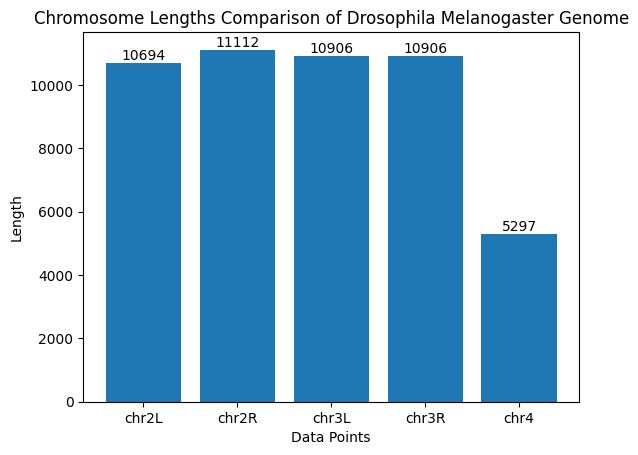

In [65]:
data_points  = [len_chr2L,len_chr2R, len_chr3L, len_chr3R, len_chr4]
x_labels = ['chr2L', 'chr2R', 'chr3L', 'chr3R', 'chr4']

plt.bar(x_labels, data_points)
plt.xlabel('Data Points')
plt.ylabel('Length')
plt.title('Chromosome Lengths Comparison of Drosophila Melanogaster Genome')
for i, v in enumerate(data_points):
    plt.text(i, v, str(v), ha='center', va='bottom')
plt.show()

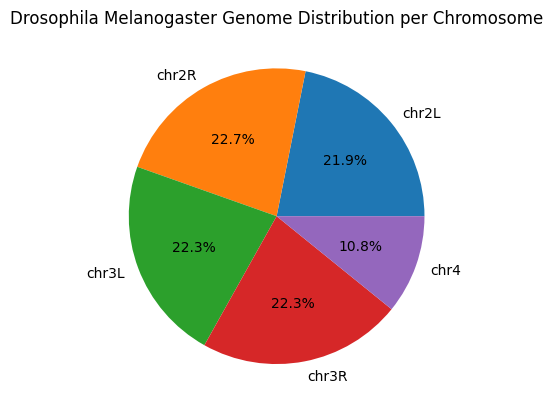

In [67]:
labels = ['chr2L', 'chr2R', 'chr3L', 'chr3R', 'chr4']

total = sum(data_points)
percentages = [(value / total) * 100 for value in data_points]

plt.pie(data_points, labels=labels, autopct='%1.1f%%')
plt.title('Drosophila Melanogaster Genome Distribution per Chromosome')

plt.show()

In [86]:
def distribute_samples(ID_Set, split_tuple):

    IDs = ID_Set['ID'].to_list()
    IDs_len = len(ID_Set)

    train_size = math.floor(((split_tuple[0]) / 100) * IDs_len)
    validation_size =math.floor(((split_tuple[1]) / 100 ) * IDs_len)
    test_size = math.floor(((split_tuple[2]) / 100) * IDs_len)

    

    numbers = list(range(0, IDs_len))
    random.shuffle(numbers)


    queue = deque(numbers)


    trainIDs = []
    validationIDs  = []
    testIDs = []


    for i in range(train_size):
       index = queue.pop()
       trainIDs.append(IDs[index])
    
    for i in range(validation_size):
       index = queue.pop()
       validationIDs.append(IDs[index])

    for i in range(test_size):
       index = queue.pop()
       testIDs.append(IDs[index])


    
    return trainIDs, validationIDs, testIDs

In [98]:
chr2L_ID_query = "SELECT ID FROM whole_data WHERE seqnames = 'chr2L'"
chr2R_ID_query = "SELECT ID FROM whole_data WHERE seqnames = 'chr2R'"
chr3L_ID_query = "SELECT ID FROM whole_data WHERE seqnames = 'chr3L'"
chr3R_ID_query = "SELECT ID FROM whole_data WHERE seqnames = 'chr3R'"
chr4_ID_query = "SELECT ID FROM whole_data WHERE seqnames = 'chr4'"

chr2L_IDs = pysqldf(chr2L_ID_query)
chr2R_IDs = pysqldf(chr2R_ID_query)
chr3L_IDs = pysqldf(chr3L_ID_query)
chr3R_IDs = pysqldf(chr3R_ID_query)
chr4_IDs= pysqldf(chr4_ID_query)


split = (60, 20, 20)
overal_train_IDs = []
overal_validation_IDs = []
overal_test_IDs = []


train1, validation1, test1 = distribute_samples(chr2L_IDs, split)
train2, validation2, test2 = distribute_samples(chr2R_IDs, split)
train3, validation3, test3 = distribute_samples(chr3L_IDs, split)
train4, validation4, test4 = distribute_samples(chr3L_IDs, split)
train5, validation5, test5 = distribute_samples(chr4_IDs, split)

overal_train_IDs.append(train1)
overal_train_IDs.append(train2)
overal_train_IDs.append(train3)
overal_train_IDs.append(train4)
overal_train_IDs.append(train5)

overal_validation_IDs.append(validation1)
overal_validation_IDs.append(validation2)
overal_validation_IDs.append(validation3)
overal_validation_IDs.append(validation4)
overal_validation_IDs.append(validation5)

overal_test_IDs.append(test1)
overal_test_IDs.append(test2)
overal_test_IDs.append(test3)
overal_test_IDs.append(test4)
overal_test_IDs.append(test5)

                             


 



df_train = pd.DataFrame(overal_train_IDs[0], columns=['ID'])
df_train['set'] = "train"
df_validation = pd.DataFrame(overal_validation_IDs[0], columns=['ID'])
df_validation['set'] = "validation"
df_test = pd.DataFrame(overal_test_IDs[0], columns=['ID'])
df_test['set'] = "test"


print(df_train)


q = "SELECT * \
    FROM whole_data \
    LEFT JOIN df_train ON whole_data.ID = df_train.ID \
    LEFT JOIN df_validation ON whole_data.ID = df_validation.ID \
    LEFT JOIN df_test ON whole_data.ID = df_test.ID"


# pysqldf(q)

 






                                    ID    set
0      random2032_chr2L:20727009:+_neg  train
1      random1744_chr2L:20304207:+_neg  train
2      FBgn0031459_chr2L:2769887:+_TSS  train
3      random3181_chr2L:13876272:+_neg  train
4       random1034_chr2L:1632195:+_neg  train
...                                ...    ...
6411   random3433_chr2L:14232342:+_neg  train
6412  FBgn0032846_chr2L:20091187:+_TSS  train
6413   FBgn0031443_chr2L:2655146:+_TSS  train
6414   random1844_chr2L:11806335:+_neg  train
6415   random3847_chr2L:14887959:+_neg  train

[6416 rows x 2 columns]
